In [1]:
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TerminateOnNaN, CSVLogger
from keras import backend as K
from keras.models import load_model
from keras.wrappers.scikit_learn import KerasClassifier
from math import ceil
import numpy as np
from matplotlib import pyplot as plt, patches
from sklearn.model_selection import train_test_split, cross_val_score

from models.ssd7_custom import build_model
from models.ssd7_resnet_backbone import resnet_build_model
from models.ssd300_custom import ssd300_build_model
from loss_function.custom_loss import AOILoss
from loss_function.custom_metric import class_mAP, offset_MAE
from custom_layers.GridCenters import GridCenters

from input_encoder_decoder.input_encoder import SSDInputEncoder
from input_encoder_decoder.output_decoder import decode_detections
from input_encoder_decoder.data_generator import DataGenerator

%matplotlib inline

2023-02-15 13:36:37.684710: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-15 13:36:38.779132: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/kerem/miniforge3/envs/tf/lib/
2023-02-15 13:36:38.779250: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/kerem/miniforge3/envs/tf/lib/
2023-02-15 13:36:38.779257: W tensorflow/compiler/tf2ten

In [2]:
img_height = 256 # Height of the input images
img_width = 256 # Width of the input images
img_channels = 3 # Number of color channels of the input images
intensity_mean = 127.5 # Set this to your preference (maybe `None`). The current settings transform the input pixel values to the interval `[-1,1]`.
intensity_range = 127.5 # Set this to your preference (maybe `None`). The current settings transform the input pixel values to the interval `[-1,1]`.
n_classes = 1 # Number of positive classes
normalize_coords = True # Whether or not the model is supposed to use coordinates relative to the image size
model_type = "transfer"

In [3]:
K.clear_session()

if model_type == "ssd7":

    model = build_model(image_size=(img_height, img_width, img_channels),
                        n_classes=n_classes,
                        l2_regularization=0.5,
                        normalize_coords=normalize_coords,
                        subtract_mean=intensity_mean,
                        divide_by_stddev=intensity_range)
    
elif model_type == "transfer":
    
    model = resnet_build_model(image_size=(img_height, img_width, img_channels),
                                n_classes=n_classes,
                                l2_regularization=0.5,
                                normalize_coords=normalize_coords)
    
elif model_type == "ssd300":
    
    model = ssd300_build_model(image_size=(img_height, img_width, img_channels),
                        n_classes=n_classes,
                        l2_regularization=0.005,
                        normalize_coords=normalize_coords,
                        subtract_mean=intensity_mean,
                        divide_by_stddev=intensity_range)
    

adam = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-08)

aoi_loss = AOILoss(neg_pos_ratio=3, alpha=3.0)

model.compile(optimizer=adam, loss=aoi_loss.compute_loss, metrics=[class_mAP, offset_MAE])

2023-02-15 13:36:40.407105: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-15 13:36:40.414306: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-15 13:36:40.414557: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-15 13:36:40.415057: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorF

In [4]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 256, 256, 3)  0           ['input_2[0][0]']                
                                                                                                  
 tf.math.subtract (TFOpLambda)  (None, 256, 256, 3)  0           ['tf.math.truediv[0][0]']        
                                                                                                  
 gaussian_noise (GaussianNoise)  (None, 256, 256, 3)  0          ['tf.math.subtract[0][0]']   

In [5]:
predictor_size = [model.get_layer('conv1').output_shape[1:3]]
print('Predictor Layer Dimensions: ', predictor_size)

encoder = SSDInputEncoder(img_height,
                          img_width,
                          n_classes,
                          predictor_sizes=predictor_size,
                          normalize_coords=True,
                          background_id=0)

generator = DataGenerator(parent_dir='/home/kerem/AOI_Project/Datasets/real_pcb_crops', encoder=encoder, augmentation=True, probability=0.1)

X, y = generator.get_data()

Predictor Layer Dimensions:  [(8, 8)]
Generating image arrays and encoding labels...
Converting images to arrays...


100%|███████████████████████████████████| 15000/15000 [00:10<00:00, 1481.90it/s]


Images as numpy:
(15000, 256, 256, 3)
Parsing ground truth labels from .csv


100%|████████████████████████████████████| 15000/15000 [00:36<00:00, 416.03it/s]


Unencoded labels:
15000
Augmenting images and relabeling...
Applying randomized augmentation...


100%|██████████████████████████████████| 15000/15000 [00:00<00:00, 23912.97it/s]


Encoded labels:
(15000, 64, 12)


In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)

print('Train dataset: ', X_train.shape)
print('Test dataset: ', X_test.shape)
print('Train labels: ', y_train.shape)
print('Test labels: ', y_test.shape)

Train dataset:  (12000, 256, 256, 3)
Test dataset:  (3000, 256, 256, 3)
Train labels:  (12000, 64, 12)
Test labels:  (3000, 64, 12)


In [7]:
model_checkpoint = ModelCheckpoint(filepath='checkpoints/ssd7_epoch-{epoch:02d}_loss-{loss:.4f}_val_loss-{val_loss:.4f}.h5',
                                   monitor='val_loss',
                                   verbose=1,
                                   save_best_only=True,
                                   save_weights_only=False,
                                   mode='auto',
                                   save_freq="epoch")

csv_logger = CSVLogger(filename='ssd7_training_log.csv',
                       separator=',',
                       append=True)

early_stopping = EarlyStopping(monitor='val_loss',
                               min_delta=0.0,
                               patience=6,
                               verbose=1,
                               restore_best_weights=True)

reduce_learning_rate = ReduceLROnPlateau(monitor='val_loss',
                                         factor=0.2,
                                         patience=4,
                                         verbose=1,
                                         min_delta=0.001,
                                         cooldown=0,
                                         min_lr=0.0000001)

callbacks = [#model_checkpoint,
             #csv_logger,
             early_stopping,
             reduce_learning_rate]

In [8]:
batch_size = 16
initial_epoch   = 0
final_epoch     = 500
steps_per_epoch = 1000

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    #steps_per_epoch=steps_per_epoch,
                    epochs=final_epoch,
                    callbacks=callbacks,
                    validation_data=(X_test, y_test),
                    #validation_steps=ceil(X_test.shape[0]/batch_size),
                    initial_epoch=initial_epoch)

2023-02-15 13:37:32.109533: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 2359296000 exceeds 10% of free system memory.
2023-02-15 13:37:33.657289: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 2359296000 exceeds 10% of free system memory.


Epoch 1/500
Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089
Instructions for updating:
Use fn_output_signature instead


2023-02-15 13:37:38.047150: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100


750/750 [==============================] - 55s 68ms/step - loss: 151.5292 - class_mAP: 0.0364 - offset_MAE: 0.2293 - val_loss: 26.4001 - val_class_mAP: 0.0207 - val_offset_MAE: 0.1176 - lr: 1.0000e-04


2023-02-15 13:38:29.875362: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.73GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


Epoch 2/500
750/750 [==============================] - 49s 66ms/step - loss: 13.7764 - class_mAP: 0.0078 - offset_MAE: 0.0927 - val_loss: 8.4219 - val_class_mAP: 9.4798e-04 - val_offset_MAE: 0.0816 - lr: 1.0000e-04
Epoch 3/500
750/750 [==============================] - 49s 66ms/step - loss: 6.7001 - class_mAP: 0.0778 - offset_MAE: 0.0688 - val_loss: 5.8173 - val_class_mAP: 0.0566 - val_offset_MAE: 0.0634 - lr: 1.0000e-04
Epoch 4/500
750/750 [==============================] - 49s 66ms/step - loss: 4.8813 - class_mAP: 0.2770 - offset_MAE: 0.0537 - val_loss: 4.5710 - val_class_mAP: 0.1948 - val_offset_MAE: 0.0466 - lr: 1.0000e-04
Epoch 5/500
750/750 [==============================] - 49s 65ms/step - loss: 3.9474 - class_mAP: 0.3508 - offset_MAE: 0.0421 - val_loss: 4.0551 - val_class_mAP: 0.1485 - val_offset_MAE: 0.0406 - lr: 1.0000e-04
Epoch 6/500
750/750 [==============================] - 49s 66ms/step - loss: 3.4475 - class_mAP: 0.3918 - offset_MAE: 0.0353 - val_loss: 3.7741 - val_class

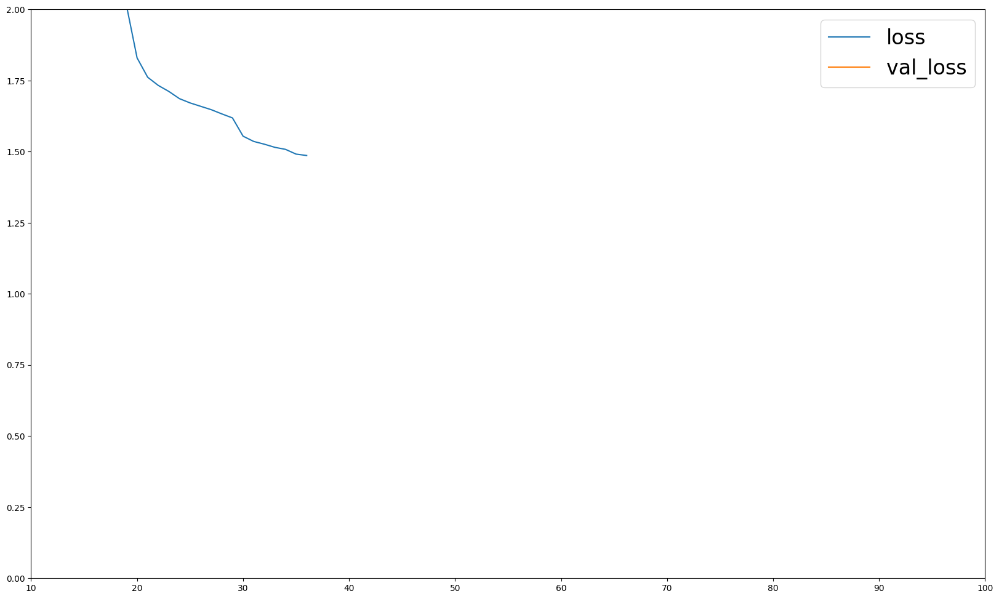

In [9]:
plt.figure(figsize=(20,12))
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlim(10, 100)
plt.ylim(0, 2)
plt.legend(loc='upper right', prop={'size': 24});

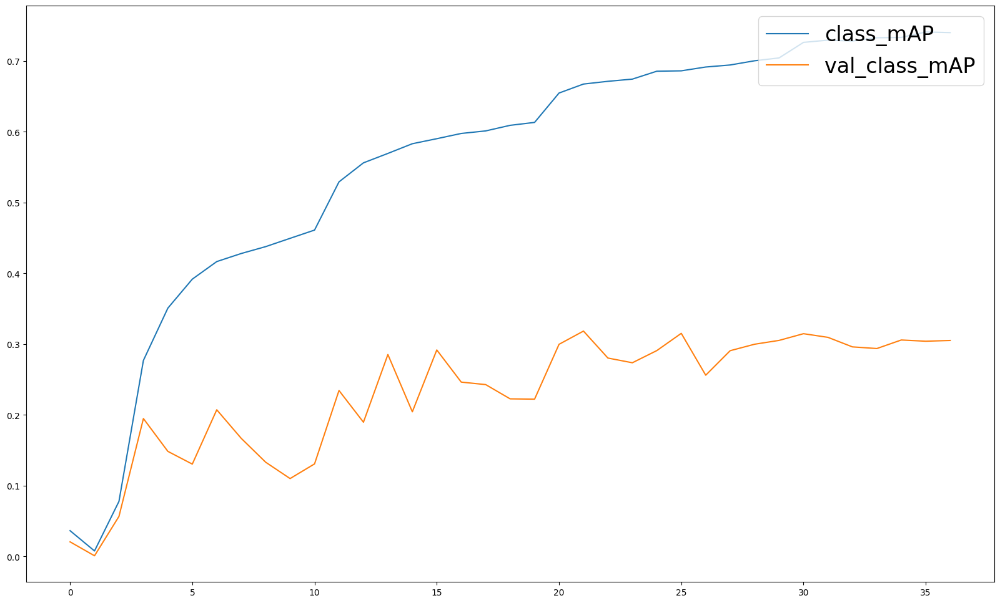

In [10]:
plt.figure(figsize=(20,12))
plt.plot(history.history['class_mAP'], label='class_mAP')
plt.plot(history.history['val_class_mAP'], label='val_class_mAP')
plt.legend(loc='upper right', prop={'size': 24});

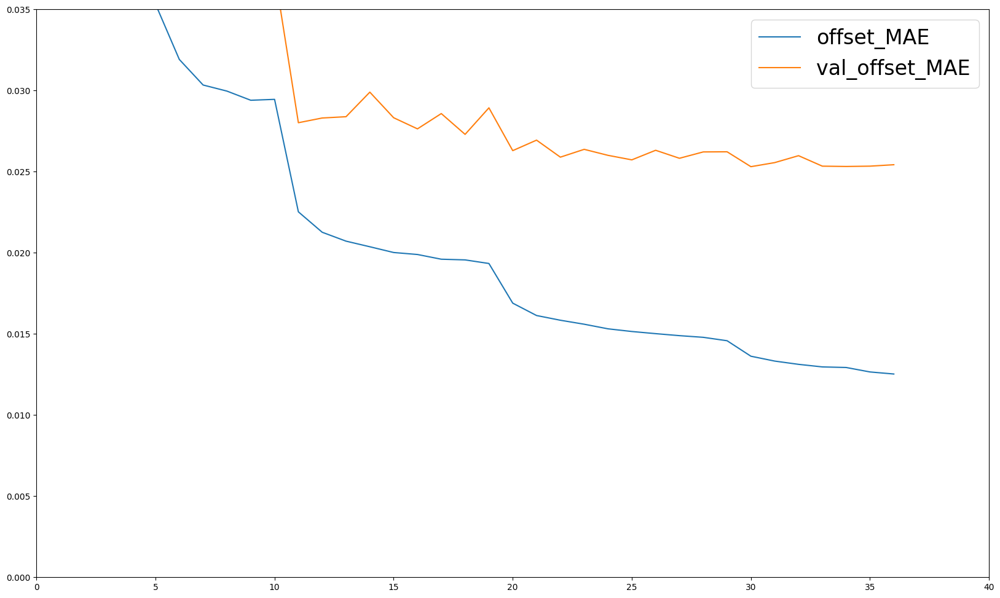

In [17]:
plt.figure(figsize=(20,12))
plt.plot(history.history['offset_MAE'], label='offset_MAE')
plt.plot(history.history['val_offset_MAE'], label='val_offset_MAE')
plt.xlim(0, 40)
plt.ylim(0, 0.035)
plt.legend(loc='upper right', prop={'size': 24});

In [12]:
predictions = model.predict(X_test[:50])
print(predictions.shape)

1/2 [==============>...............] - ETA: 1s

2023-02-15 14:07:51.876651: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.90GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


2/2 [==============================] - 2s 379ms/step
(50, 64, 12)


2023-02-15 14:07:52.257548: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.80GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


In [13]:
decoded_pred = decode_detections(predictions, img_height=img_height, img_width=img_width)
print(decoded_pred[0])

[]


In [14]:
decoded_labels = decode_detections(y_test[:50], img_height=img_height, img_width=img_width)
print(decoded_labels[0])

[[  1.   1.  28.  27. 185.  23.  32. 183. 189. 179.]]


/tmp/ipykernel_9494/681948693.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


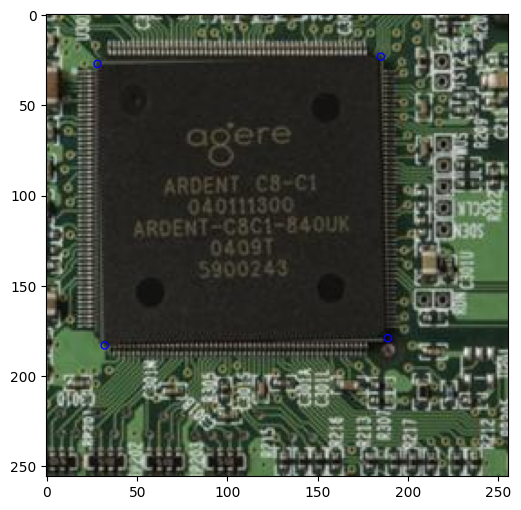

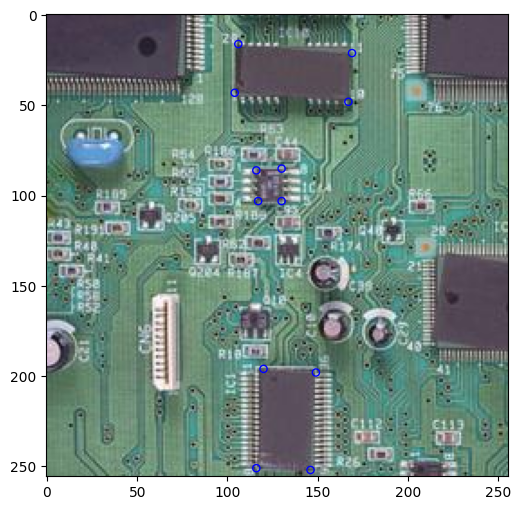

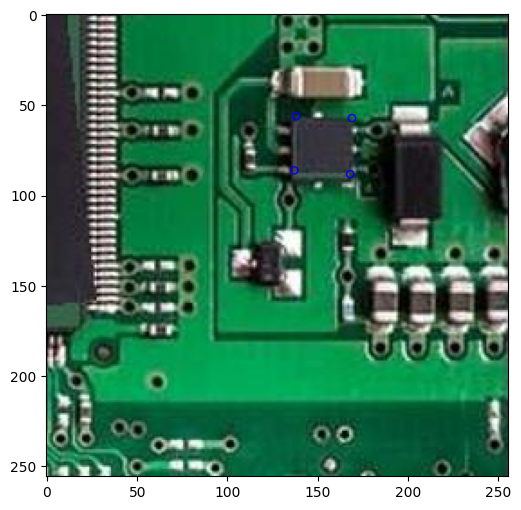

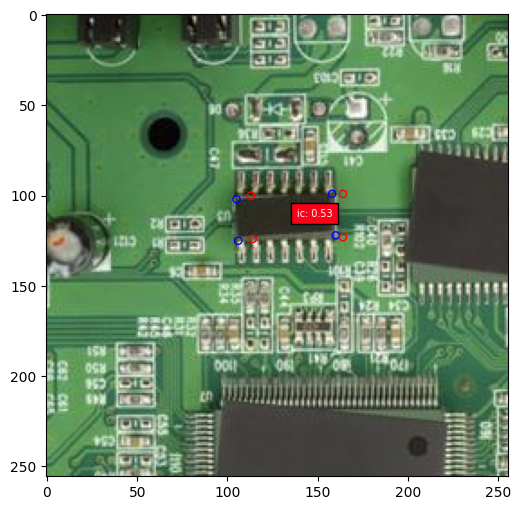

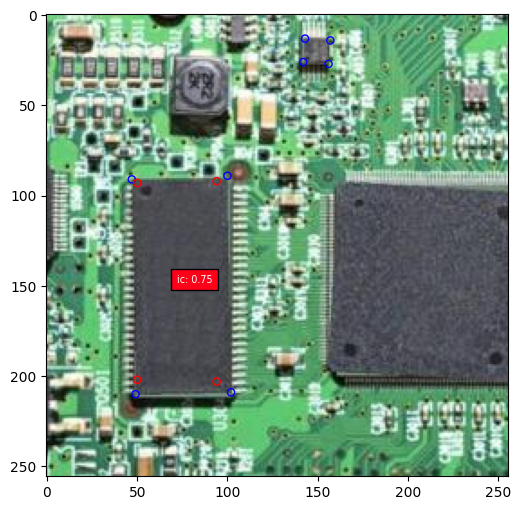

...

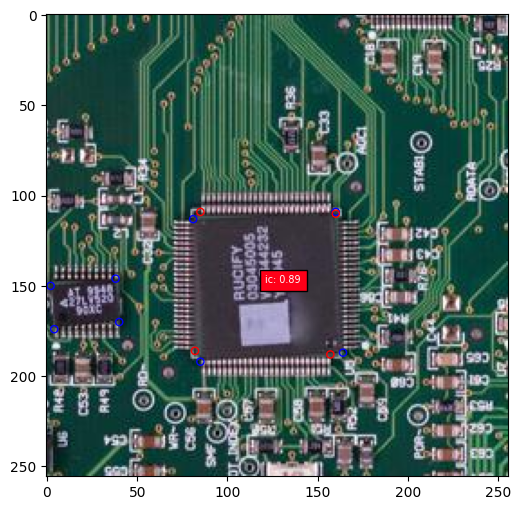

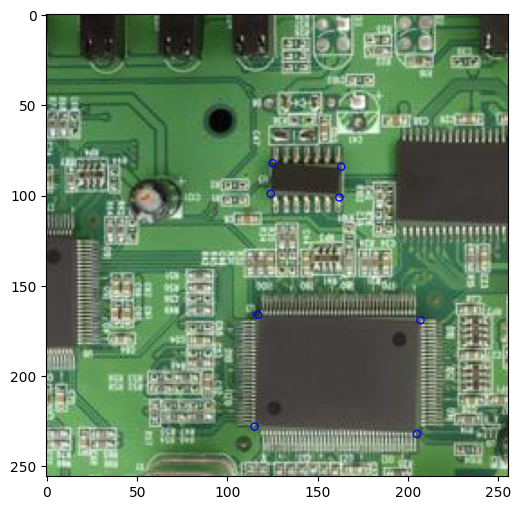

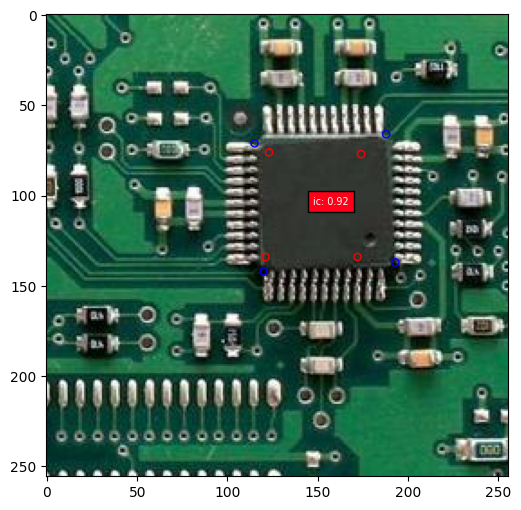

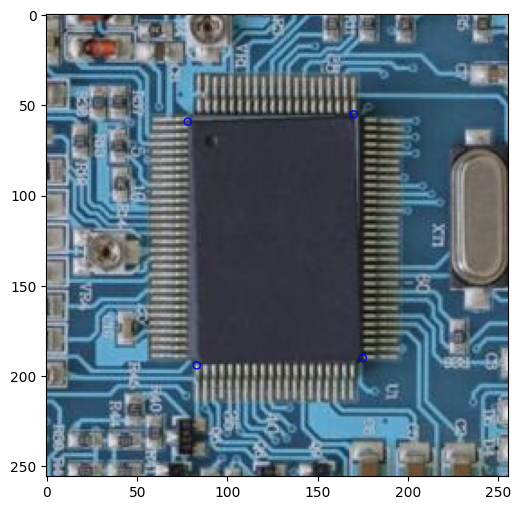

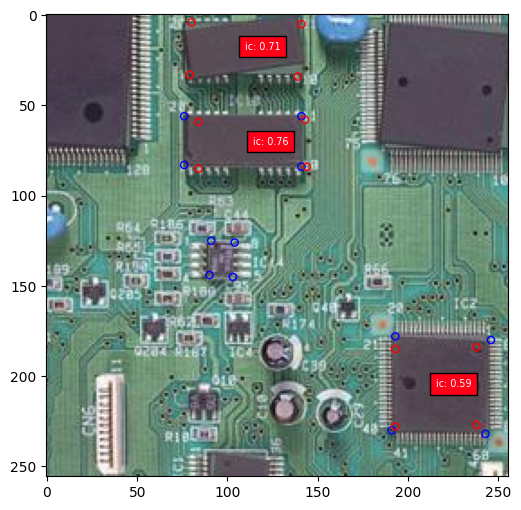

In [15]:
for i in range(len(decoded_pred[:30])):
    plt.figure(figsize=(10,6))
    plt.imshow(X_test[i])
    current_axis = plt.gca()

    colors = plt.cm.hsv(np.linspace(0, 1, n_classes+1)).tolist() # Set the colors for the bounding boxes
    classes = ['background', 'ic'] # Just so we can print class names onto the image instead of IDs
    
    for label in decoded_labels[i]:
        pred = np.array(label)
        corners = np.reshape(pred[2:], (-1, 2)).astype(int)
        color = colors[int(pred[0])]
        label = '{}'.format(classes[int(pred[0])])
        for points in corners:
            current_axis.add_patch(plt.Circle(tuple(points), 2, fill=False, color='blue'))
    
    for label in decoded_pred[i]:
        pred = np.array(label)
        corners = np.reshape(pred[2:], (-1, 2)).astype(int)
        color = colors[int(pred[0])]
        label = '{}: {:.2f}'.format(classes[int(pred[0])], pred[1])
        for points in corners:
            current_axis.add_patch(plt.Circle(tuple(points), 2, fill=False, color='red'))
        center_x = (corners[0, 0] + corners[3, 0]) / 2
        center_y = (corners[0, 1] + corners[3, 1]) / 2
        current_axis.text(center_x, center_y, label, size='x-small', color='white', bbox={'facecolor':color, 'alpha':1.0})
        

In [18]:
#model.save("model_realistic_pcb_ssd6_conv6_256_15000_relu_noise_mobilenetv2_locked")

INFO:tensorflow:Assets written to: model_realistic_pcb_ssd6_conv6_256_15000_relu_noise_mobilenetv2_locked/assets


INFO:tensorflow:Assets written to: model_realistic_pcb_ssd6_conv6_256_15000_relu_noise_mobilenetv2_locked/assets
